## Problem statement: To compute probability for a borrower to default in any loan obligation in the upcoming (future) 12 months

### The target variable for the model would be the default status of the borrower, i.e., whether the borrower has defaulted or not. The features would be the various columns in the dataset that are relevant for predicting default, such as the NO_OF_DAYS_PAST_DUE

### 1.Import Data and Required Packages
    Importing Pandas, Numpy, Matplotlib, Seaborn and Warings Library.

In [1]:
import pandas as pd
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import plotly.express as px
import warnings
from urllib import request 

warnings.filterwarnings("ignore")

%matplotlib inline

<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


### Import the CSV Data as Pandas DataFrame

In [2]:
df=pd.read_csv('Borrower_Payment_History.csv')

### Show Top 5 Records

In [3]:
df.head()

,subject_id,account_id,DATE_REPORTED,currency_code,REPAYMENT_FREQUENCY,NUMBER_OF_INSTALLMENTS,SANCTION_AMT,TOT_OUTSTD_BAL,OVER_DUE_AMT,AMOUNT_OF_INSTALLMENT,DATE_LATEST_PAY_RECEIVED,LAST_AMOUNT_PAID,DATE_ACC_OPEN,DATE_ACC_CLOSE,INSTALMENT_LOAN_TYPE,loan_status,ASSET_CLASSIFICATION,REASON_FOR_CLOSURE,NO_OF_DAYS_PAST_DUE,LOAN_TENURE,EXPECTED_END_DATE_OF_LOAN
0,110113010000498773,2201160002396407,02-JAN-18,TZS,MonthlyInstalments30Days,6.0,400000.0,0.00,205609.4,0.00,29-NOV-16,NaN,29-JUN-16,29-DEC-16,OtherInstalmentOperation,Existing,NaN,NaN,399.0,NaN,29-DEC-16
1,110115010001596750,2201170002990772,08-JAN-18,TZS,MonthlyInstalments30Days,61.0,3500000.0,3272849.49,0.0,100243.11,29-DEC-17,NaN,29-JUN-17,05-JUL-22,ConsumerLoan,Existing,NaN,NaN,0.0,NaN,05-JUL-22
2,110114010000832340,2201140001177207,02-JAN-18,TZS,MonthlyInstalments30Days,57.0,4200000.0,870462.93,0.0,106652.40,28-DEC-17,NaN,27-DEC-13,NaN,ConsumerLoan,Existing,NaN,NaN,0.0,NaN,27-SEP-18
3,110114010000740514,2201160002371670,02-JAN-18,TZS,MonthlyInstalments30Days,24.0,60000000.0,15740676.93,0.0,2987342.81,18-DEC-17,NaN,11-MAY-16,NaN,BusinessLoan,Existing,NaN,NaN,18.0,NaN,11-MAY-18
4,110114010000811717,2201140001161294,08-JAN-18,TZS,MonthlyInstalments30Days,69.0,3400000.0,828981.51,0.0,99164.00,29-DEC-17,NaN,20-FEB-13,16-NOV-18,ConsumerLoan,Existing,NaN,NaN,0.0,NaN,16-NOV-18


#### Shape of the dataset

In [4]:
df.shape

(6000, 21)

#### Summary of the dataset

In [5]:
# Display summary statistics for a dataframe
df.describe()

,subject_id,account_id,NUMBER_OF_INSTALLMENTS,SANCTION_AMT,TOT_OUTSTD_BAL,OVER_DUE_AMT,AMOUNT_OF_INSTALLMENT,LAST_AMOUNT_PAID,ASSET_CLASSIFICATION,REASON_FOR_CLOSURE,NO_OF_DAYS_PAST_DUE,LOAN_TENURE
count,6.000000e+03,6.000000e+03,5921.000000,6.000000e+03,5.981000e+03,5.993000e+03,5.972000e+03,0.0,0.0,0.0,5929.000000,0.0
mean,1.101153e+17,2.201167e+15,37.130214,8.037075e+06,5.901409e+06,1.994213e+05,2.972762e+05,NaN,NaN,NaN,19.573790,NaN
std,1.788675e+12,1.644534e+10,27.176235,1.532329e+07,1.274324e+07,2.350980e+06,8.165481e+05,NaN,NaN,NaN,93.517353,NaN
min,1.101130e+17,2.201130e+15,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,NaN,NaN,NaN,0.000000,NaN
25%,1.101140e+17,2.201160e+15,7.000000,1.000000e+06,9.450000e+04,0.000000e+00,8.333333e+04,NaN,NaN,NaN,0.000000,NaN
50%,1.101150e+17,2.201170e+15,48.000000,4.479500e+06,1.847817e+06,0.000000e+00,1.609475e+05,NaN,NaN,NaN,0.000000,NaN
75%,1.101170e+17,2.201180e+15,60.000000,9.500000e+06,7.140102e+06,0.000000e+00,2.861404e+05,NaN,NaN,NaN,0.000000,NaN
max,1.101190e+17,2.201190e+15,246.000000,4.000000e+08,3.254362e+08,1.032456e+08,2.500000e+07,NaN,NaN,NaN,999.000000,NaN


### 2. Check Datatypes in the dataset

    Some of the Feature columns having no values those are ['LAST_AMOUNT_PAID',  'ASSET_CLASSIFICATION','REASON_FOR_CLOSURE','LOAN_TENURE','subject_id','account_id']

In [6]:
# Check Null and Dtypes
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6000 entries, 0 to 5999
Data columns (total 21 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   subject_id                 6000 non-null   int64  
 1   account_id                 6000 non-null   int64  
 2   DATE_REPORTED              6000 non-null   object 
 3   currency_code              6000 non-null   object 
 4   REPAYMENT_FREQUENCY        5982 non-null   object 
 5   NUMBER_OF_INSTALLMENTS     5921 non-null   float64
 6   SANCTION_AMT               6000 non-null   float64
 7   TOT_OUTSTD_BAL             5981 non-null   float64
 8   OVER_DUE_AMT               5993 non-null   float64
 9   AMOUNT_OF_INSTALLMENT      5972 non-null   float64
 10  DATE_LATEST_PAY_RECEIVED   4647 non-null   object 
 11  LAST_AMOUNT_PAID           0 non-null      float64
 12  DATE_ACC_OPEN              6000 non-null   object 
 13  DATE_ACC_CLOSE             2934 non-null   objec

### Creating Default_status value Dependent Feature with the Below condition
    yes-1
    no-0
    
   ### To create the default status column based on the NO_OF_DAYS_PAST_DUE column

    Conditions:

    If the value of the "NO_OF_DAYS_PAST_DUE" column is greater than or equal to 90 days, set the value of the "default_status" column to "Yes" indicating that the borrower has defaulted.
    If the value of the "NO_OF_DAYS_PAST_DUE" column is less than 90 days, set the value of the "default_status" column to "No" indicating that the borrower has not defaulted.

In [7]:
# add a new column for default status
df['default_status'] = ''

# loop through each row and set the default status
for index, row in df.iterrows():
    if row['NO_OF_DAYS_PAST_DUE'] >= 90:
        df.at[index, 'default_status'] = 'yes'
    else:
        df.at[index, 'default_status'] = 'NO'

In [8]:
# Droping the NO_OF_DAYS_PAST_DUE Column
df.drop(['NO_OF_DAYS_PAST_DUE'], axis=1, inplace=True)

### Droping the Null Column

In [9]:
# Droping the Null Column
df.drop(['LAST_AMOUNT_PAID',  'ASSET_CLASSIFICATION','REASON_FOR_CLOSURE','LOAN_TENURE','subject_id','account_id'], axis=1, inplace=True)    

In [119]:
df

,DATE_REPORTED,currency_code,REPAYMENT_FREQUENCY,NUMBER_OF_INSTALLMENTS,SANCTION_AMT,TOT_OUTSTD_BAL,OVER_DUE_AMT,AMOUNT_OF_INSTALLMENT,DATE_LATEST_PAY_RECEIVED,DATE_ACC_OPEN,DATE_ACC_CLOSE,INSTALMENT_LOAN_TYPE,loan_status,EXPECTED_END_DATE_OF_LOAN,default_status,YEAR_REPORTED,MONTH_REPORTED,DAY_REPORTED,DAY_OF_WEEK_REPORTED,ACCOUNT_AGE,LAST_PAYMENT_AGE,LOAN_DURATION
0,2018-01-02,TZS,MonthlyInstalments30Days,6.0,4.000000e+05,0.000000e+00,2.056094e+05,0.00,2016-11-29,2016-06-29,2016-12-29,OtherInstalmentOperation,Existing,2016-12-29,yes,2018,1,2,1,552,399.0,183
1,2018-01-08,TZS,MonthlyInstalments30Days,61.0,3.500000e+06,3.272849e+06,0.000000e+00,100243.11,2017-12-29,2017-06-29,2022-07-05,ConsumerLoan,Existing,2022-07-05,NO,2018,1,8,0,193,10.0,1832
2,2018-01-02,TZS,MonthlyInstalments30Days,57.0,4.200000e+06,8.704629e+05,0.000000e+00,106652.40,2017-12-28,2013-12-27,NaT,ConsumerLoan,Existing,2018-09-27,NO,2018,1,2,1,1467,5.0,1735
3,2018-01-02,TZS,MonthlyInstalments30Days,24.0,6.000000e+07,1.574068e+07,0.000000e+00,2987342.81,2017-12-18,2016-05-11,NaT,BusinessLoan,Existing,2018-05-11,NO,2018,1,2,1,601,15.0,730
4,2018-01-08,TZS,MonthlyInstalments30Days,69.0,3.400000e+06,8.289815e+05,0.000000e+00,99164.00,2017-12-29,2013-02-20,2018-11-16,ConsumerLoan,Existing,2018-11-16,NO,2018,1,8,0,1783,10.0,2095
5,2018-01-11,TZS,MonthlyInstalments30Days,36.0,4.000000e+06,0.000000e+00,0.000000e+00,152761.81,2014-11-07,2012-08-24,2015-08-24,OtherInstalmentOperation,TerminatedAccordingTheContract,2015-08-24,NO,2018,1,11,3,1966,1161.0,1095
6,2018-01-02,TZS,MonthlyInstalments30Days,60.0,1.010000e+07,1.422650e+07,0.000000e+00,278951.01,2017-12-28,2017-03-30,NaT,ConsumerLoan,Existing,2022-04-28,NO,2018,1,2,1,278,5.0,1855
7,2018-01-02,TZS,MonthlyInstalments30Days,6.0,7.000000e+05,5.948521e+05,0.000000e+00,109506.87,2017-12-18,2017-11-16,NaT,OtherInstalmentOperation,Existing,2018-05-16,NO,2018,1,2,1,47,15.0,181
8,2018-01-31,TZS,MonthlyInstalments30Days,36.0,6.000000e+06,5.446339e+06,0.000000e+00,233425.00,2018-01-05,2017-07-15,NaT,ConsumerLoan,Existing,2020-08-05,NO,2018,1,31,2,200,26.0,1117
9,2018-01-11,TZS,MonthlyInstalments30Days,32.0,4.551767e+06,0.000000e+00,0.000000e+00,173305.31,2015-09-27,2012-12-18,2015-08-25,ConsumerLoan,TerminatedAccordingTheContract,2015-08-25,NO,2018,1,11,3,1850,837.0,980


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6000 entries, 0 to 5999
Data columns (total 15 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   DATE_REPORTED              6000 non-null   object 
 1   currency_code              6000 non-null   object 
 2   REPAYMENT_FREQUENCY        5982 non-null   object 
 3   NUMBER_OF_INSTALLMENTS     5921 non-null   float64
 4   SANCTION_AMT               6000 non-null   float64
 5   TOT_OUTSTD_BAL             5981 non-null   float64
 6   OVER_DUE_AMT               5993 non-null   float64
 7   AMOUNT_OF_INSTALLMENT      5972 non-null   float64
 8   DATE_LATEST_PAY_RECEIVED   4647 non-null   object 
 9   DATE_ACC_OPEN              6000 non-null   object 
 10  DATE_ACC_CLOSE             2934 non-null   object 
 11  INSTALMENT_LOAN_TYPE       5920 non-null   object 
 12  loan_status                6000 non-null   object 
 13  EXPECTED_END_DATE_OF_LOAN  6000 non-null   objec

### 3. EXPLORING DATA

In [12]:
# define numerical & categorical columns
numeric_features = [feature for feature in df.columns if df[feature].dtype != 'O']
categorical_features = [feature for feature in df.columns if df[feature].dtype == 'O']

# print columns
print('We have {} numerical features : {}'.format(len(numeric_features), numeric_features))
print('\nWe have {} categorical features : {}'.format(len(categorical_features), categorical_features))

We have 5 numerical features : ['NUMBER_OF_INSTALLMENTS', 'SANCTION_AMT', 'TOT_OUTSTD_BAL', 'OVER_DUE_AMT', 'AMOUNT_OF_INSTALLMENT']

We have 10 categorical features : ['DATE_REPORTED', 'currency_code', 'REPAYMENT_FREQUENCY', 'DATE_LATEST_PAY_RECEIVED', 'DATE_ACC_OPEN', 'DATE_ACC_CLOSE', 'INSTALMENT_LOAN_TYPE', 'loan_status', 'EXPECTED_END_DATE_OF_LOAN', 'default_status']


### Feature Information

        subject_id===	Borrower unique identification number
        account_id===	Loan unique identification number
        DATE_REPORTED===	Payment information reported date
        currency_code===	Currency in which loan is reported
        REPAYMENT_FREQUENCY===	Periodicity of payment
        NUMBER_OF_INSTALLMENTS===	Total number of loan installments
        SANCTION_AMT===	Loan amount sanctioned by the bank
        TOT_OUTSTD_BAL===	Total outstanding balance
        OVER_DUE_AMT===	Overdue amount
        AMOUNT_OF_INSTALLMENT===	Installment amount
        DATE_LATEST_PAY_RECEIVED===	Last payment received date
        LAST_AMOUNT_PAID===	Last installment amount paid to the bank
        DATE_ACC_OPEN===	Loan opened date
        DATE_ACC_CLOSE===	Actual Loan closed date
        INSTALMENT_LOAN_TYPE===	Type of credit
        loan_status===	Loan status
        REASON_FOR_CLOSURE===	Reason for loan closure
        NO_OF_DAYS_PAST_DUE===	Number of days past due
        LOAN_TENURE===	Total loan tenure
        EXPECTED_END_DATE_OF_LOAN===	Expected loan closure date

In [13]:
# proportion of count data on categorical columns
for col in categorical_features:
    print(df[col].value_counts(normalize=True) * 100)
    print('---------------------------')

31-JUL-18    8.333333
01-OCT-18    8.283333
08-MAR-18    8.150000
10-DEC-18    6.950000
08-NOV-18    6.250000
31-AUG-18    5.816667
03-SEP-18    5.266667
09-FEB-18    4.883333
02-JAN-18    4.800000
07-MAY-18    4.800000
30-JUN-18    4.800000
06-APR-18    4.116667
30-APR-18    3.050000
30-SEP-18    3.016667
31-JAN-18    2.283333
08-FEB-18    2.216667
02-AUG-18    2.183333
06-JUN-18    1.983333
31-MAY-18    1.883333
30-NOV-18    1.600000
10-MAY-18    1.566667
08-DEC-18    1.383333
10-JUN-18    1.300000
26-FEB-18    0.950000
19-APR-18    0.933333
11-JAN-18    0.783333
08-JAN-18    0.466667
01-NOV-18    0.400000
03-AUG-18    0.333333
03-FEB-18    0.283333
08-JUN-18    0.250000
02-MAR-18    0.183333
05-APR-18    0.166667
02-MAY-18    0.083333
04-NOV-18    0.083333
03-APR-18    0.066667
31-OCT-18    0.050000
01-SEP-18    0.050000
Name: DATE_REPORTED, dtype: float64
---------------------------
TZS    99.9
USD     0.1
Name: currency_code, dtype: float64
---------------------------
MonthlyInsta

### Univariate Analysis

##### The term univariate analysis refers to the analysis of one variable prefix “uni” means “one.” The purpose of univariate analysis is to understand the distribution of values for a single variable.

### Numerical Features

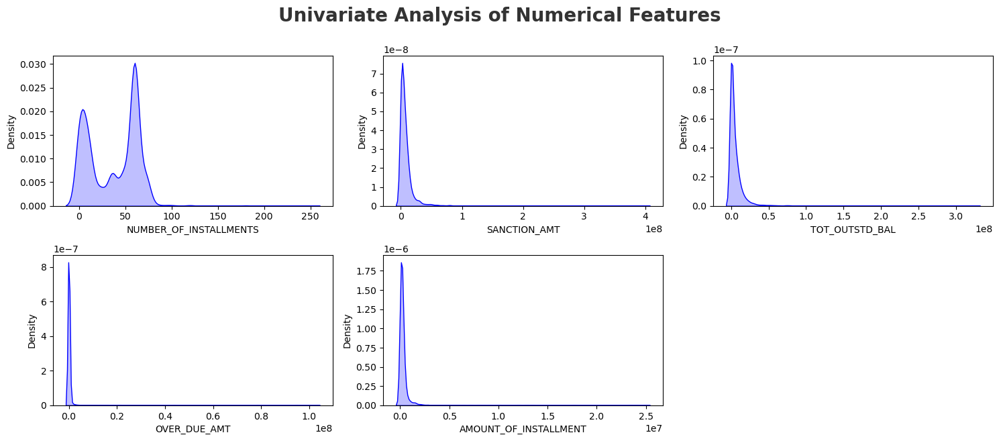

In [14]:
plt.figure(figsize=(15, 15))
plt.suptitle('Univariate Analysis of Numerical Features', fontsize=20, fontweight='bold', alpha=0.8, y=1.)

for i in range(0, len(numeric_features)):
    plt.subplot(5, 3, i+1)
    sns.kdeplot(x=df[numeric_features[i]],shade=True, color='b')
    plt.xlabel(numeric_features[i])
    plt.tight_layout()
    
# save plot
plt.savefig('./images/Univariate_Num.png')

### Categorical Features

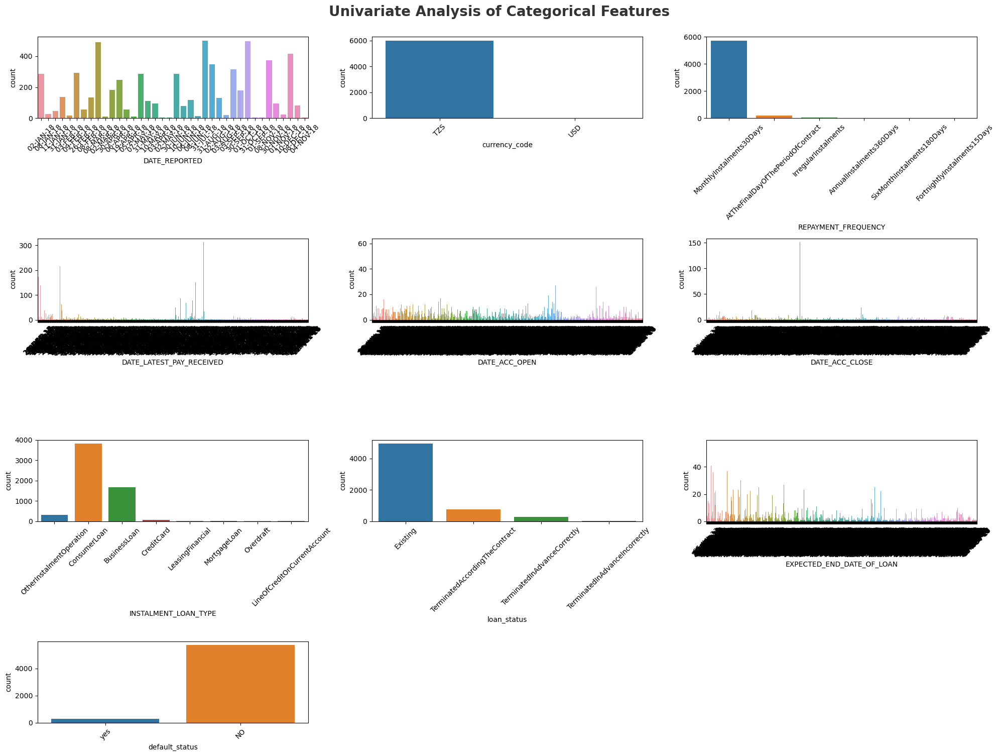

In [15]:
# categorical columns
plt.figure(figsize=(20, 15))
plt.suptitle('Univariate Analysis of Categorical Features', fontsize=20, fontweight='bold', alpha=0.8, y=1.)
for i in range(0, len(categorical_features)):
    plt.subplot(4, 3, i+1)
    sns.countplot(x=df[categorical_features[i]])
    plt.xlabel(categorical_features[i])
    plt.xticks(rotation=45)
    plt.tight_layout()
    
# save plot
plt.savefig('./images/Univariate_Cat.png')

### 4. Multivariate Analysis
    Multivariate analysis is the analysis of more than one variable.

### Check Multicollinearity in Numerical features

In [16]:
df[(list(df.columns)[1:])].corr()

,NUMBER_OF_INSTALLMENTS,SANCTION_AMT,TOT_OUTSTD_BAL,OVER_DUE_AMT,AMOUNT_OF_INSTALLMENT
NUMBER_OF_INSTALLMENTS,1.000000,0.376970,0.386724,-0.013033,-0.009527
SANCTION_AMT,0.376970,1.000000,0.904414,0.166491,0.443927
TOT_OUTSTD_BAL,0.386724,0.904414,1.000000,0.117634,0.409710
OVER_DUE_AMT,-0.013033,0.166491,0.117634,1.000000,0.092492
AMOUNT_OF_INSTALLMENT,-0.009527,0.443927,0.409710,0.092492,1.000000


In [17]:
discrete_features=[feature for feature in numeric_features if len(df[feature].unique())<=25]

continuous_features=[feature for feature in numeric_features if len(df[feature].unique()) > 25]

print('We have {} discrete features : {}'.format(len(discrete_features), discrete_features))
print('\nWe have {} continuous_features : {}'.format(len(continuous_features), continuous_features))

We have 0 discrete features : []

We have 5 continuous_features : ['NUMBER_OF_INSTALLMENTS', 'SANCTION_AMT', 'TOT_OUTSTD_BAL', 'OVER_DUE_AMT', 'AMOUNT_OF_INSTALLMENT']


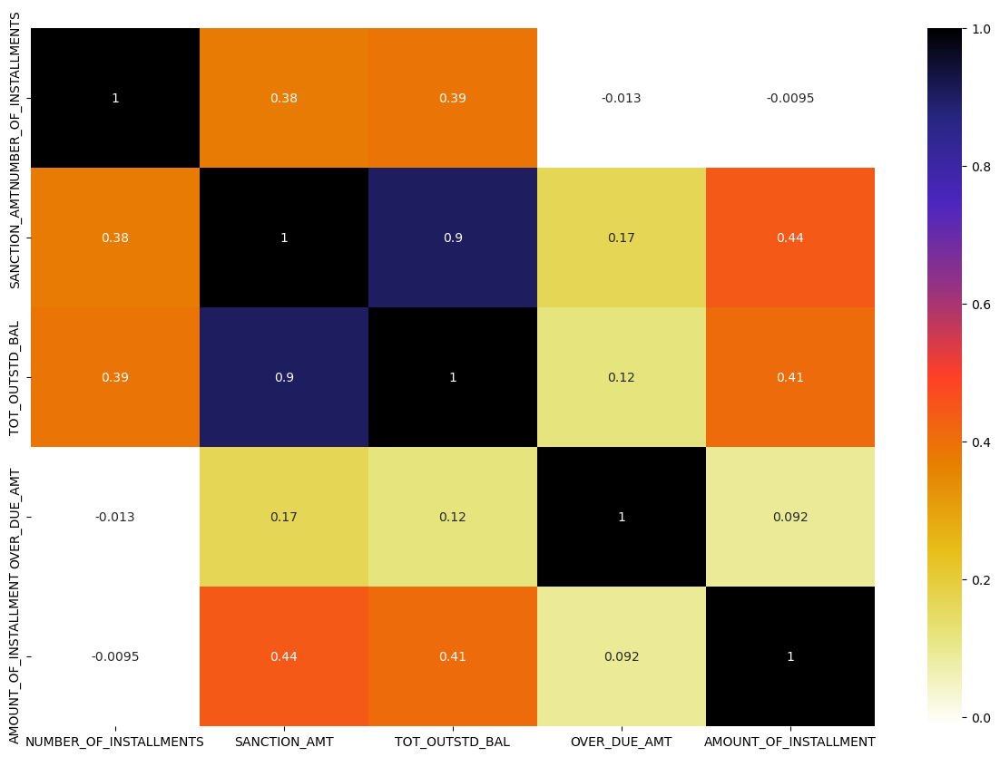

In [18]:
plt.figure(figsize = (15,10))
sns.heatmap(df.corr(), cmap="CMRmap_r", annot=True)
plt.show()

##### Report

 Multicolinnearity found in the dataset

### Check Multicollinearity for Categorical features

A chi-squared test (also chi-square or χ2 test) is a statistical hypothesis test that is valid to perform when the test statistic is chi-squared distributed under the null hypothesis, specifically Pearson's chi-squared test

A chi-square statistic is one way to show a relationship between two categorical variables.

Here we test correlation of Categorical columns with Target column i.e default_status

Null Hypothesis (
): The Feature is independent of target column (No-Correlation)

Alternative Hypothesis (
): The Feature and Target column are not independent (Correalted)

In [19]:
from scipy.stats import chi2_contingency
chi2_test = []
for feature in categorical_features:
    if chi2_contingency(pd.crosstab(df['default_status'], df[feature]))[1] < 0.05:
        chi2_test.append('Reject Null Hypothesis')
    else:
        chi2_test.append('Fail to Reject Null Hypothesis')
result = pd.DataFrame(data=[categorical_features, chi2_test]).T
result.columns = ['Column', 'Hypothesis Result']
result

,Column,Hypothesis Result
0,DATE_REPORTED,Reject Null Hypothesis
1,currency_code,Fail to Reject Null Hypothesis
2,REPAYMENT_FREQUENCY,Reject Null Hypothesis
3,DATE_LATEST_PAY_RECEIVED,Reject Null Hypothesis
4,DATE_ACC_OPEN,Reject Null Hypothesis
5,DATE_ACC_CLOSE,Reject Null Hypothesis
6,INSTALMENT_LOAN_TYPE,Reject Null Hypothesis
7,loan_status,Reject Null Hypothesis
8,EXPECTED_END_DATE_OF_LOAN,Reject Null Hypothesis
9,default_status,Reject Null Hypothesis


Report

     Here currency_code fails to Rejects Null Hypothesis which means it doesn't correlate with target column.

### Checking Null Values

In [20]:
df.isnull().sum()

DATE_REPORTED                   0
currency_code                   0
REPAYMENT_FREQUENCY            18
NUMBER_OF_INSTALLMENTS         79
SANCTION_AMT                    0
TOT_OUTSTD_BAL                 19
OVER_DUE_AMT                    7
AMOUNT_OF_INSTALLMENT          28
DATE_LATEST_PAY_RECEIVED     1353
DATE_ACC_OPEN                   0
DATE_ACC_CLOSE               3066
INSTALMENT_LOAN_TYPE           80
loan_status                     0
EXPECTED_END_DATE_OF_LOAN       0
default_status                  0
dtype: int64

In [21]:
continuous_features=[feature for feature in numeric_features if len(df[feature].unique())>=10]
print('Num of continues features :',continuous_features)

Num of continues features : ['NUMBER_OF_INSTALLMENTS', 'SANCTION_AMT', 'TOT_OUTSTD_BAL', 'OVER_DUE_AMT', 'AMOUNT_OF_INSTALLMENT']


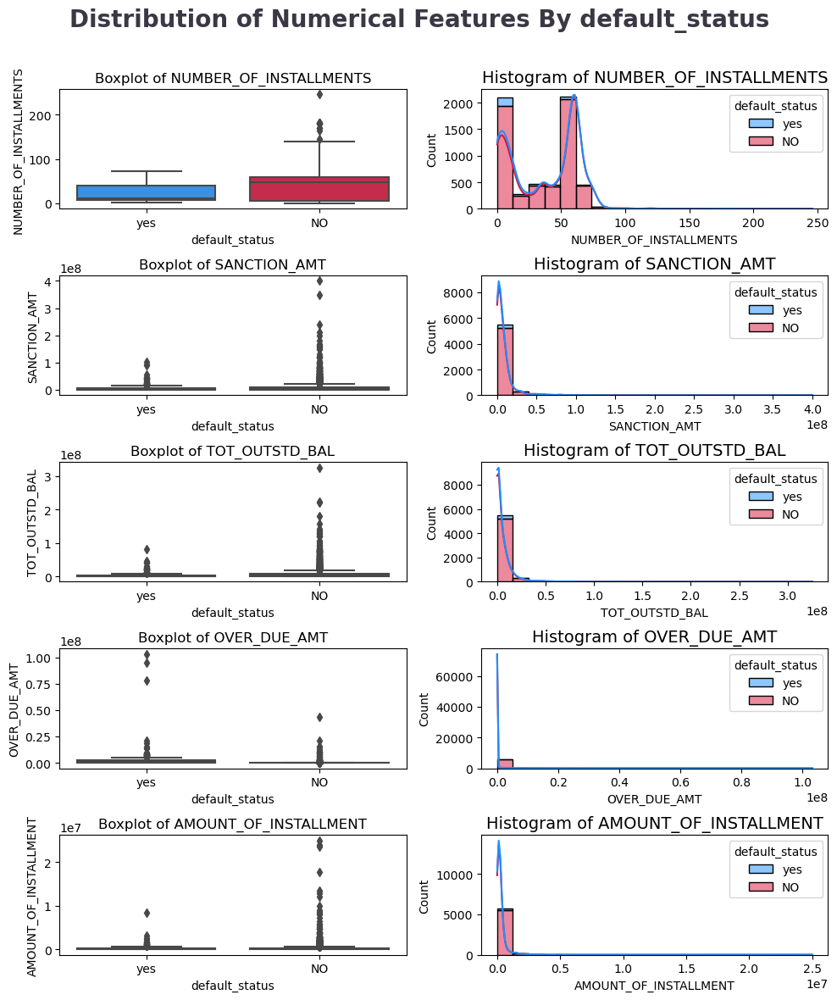

In [22]:
clr1 = ['#1E90FF', '#DC143C']
fig, ax = plt.subplots(5, 2, figsize=(10,12))
fig.suptitle('Distribution of Numerical Features By default_status', color='#3C3744',
             fontsize=20, fontweight='bold', ha='center')
for i, col in enumerate(continuous_features):   
    sns.boxplot(data=df, x='default_status', y=col,  palette=clr1, ax=ax[i,0])
    ax[i,0].set_title(f'Boxplot of {col}', fontsize=12)
    sns.histplot(data=df, x=col, hue='default_status', bins=20, kde=True, 
                 multiple='stack', palette=clr1, ax=ax[i,1])
    ax[i,1].set_title(f'Histogram of {col}', fontsize=14)
fig.tight_layout()
fig.subplots_adjust(top=0.90)
plt.savefig('images/multivariate_num.png')

## Initial Analysis Report
     Based on the exploratory data analysis (EDA) of the given loan dataset, we can conclude the following:

        -Majority of the loans in the dataset are from the year 2016 and 2017.
        -Most of the loans are given for a tenure of 12 to 24 months.
        -The sanctioned amount for most of the loans is between 0 to 1,000,000.
        -Majority of the loans have an installment frequency of monthly.
        -Most of the loans have a repayment frequency of monthly.
        -Most of the loans have an outstanding balance of 0 to 500,000.
        -Majority of the loans do not have any overdue amount.
        -Most of the loans have an account age of less than 2000 days.
        -Majority of the loans have a last payment age of less than 1000 days.
        -The default rate for the given loans is around 15%. 

## 5. Visualization

###  Visualize the Target Feature

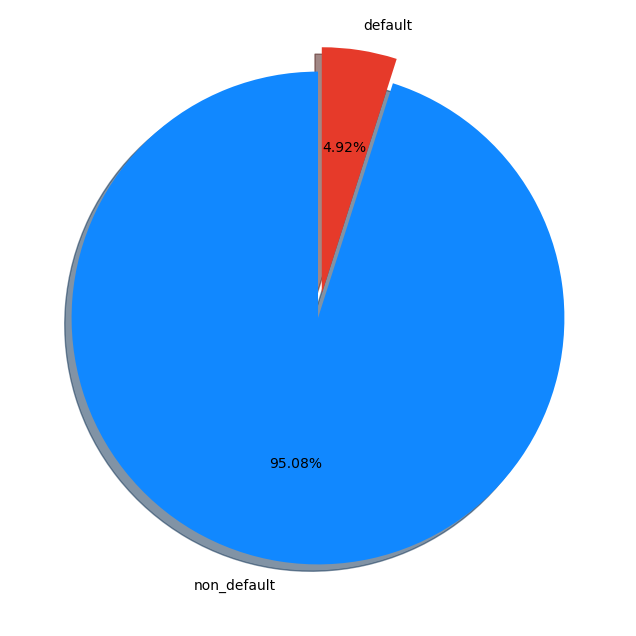

In [23]:
percentage = df.default_status.value_counts(normalize=True)*100
labels = ["non_default","default"]

# Plot PieChart with Ploty library
fig, ax = plt.subplots(figsize =(15, 8))
explode = (0, 0.1)
colors = ['#1188ff','#e63a2a']
ax.pie(percentage, labels = labels, startangle = 90,
       autopct='%1.2f%%',explode=explode, shadow=True, colors=colors)
plt.show()

From the chart it is seen that the Target Variable is Imbalanced
What is imbalanced data?

Imbalanced data are types of data where the target class has an uneven distribution of observations, i.e Here non_default value has more count than the default value of the dataset.

### Feature Engineering

 ## Detecting Outlier with box plot

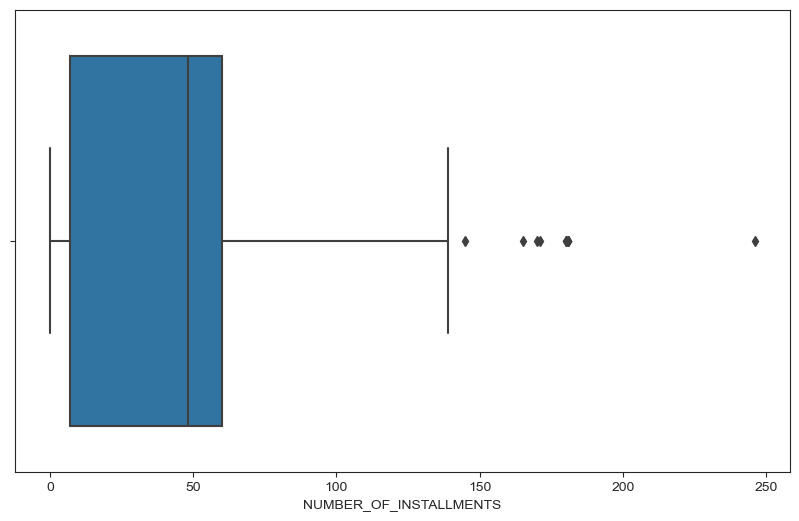

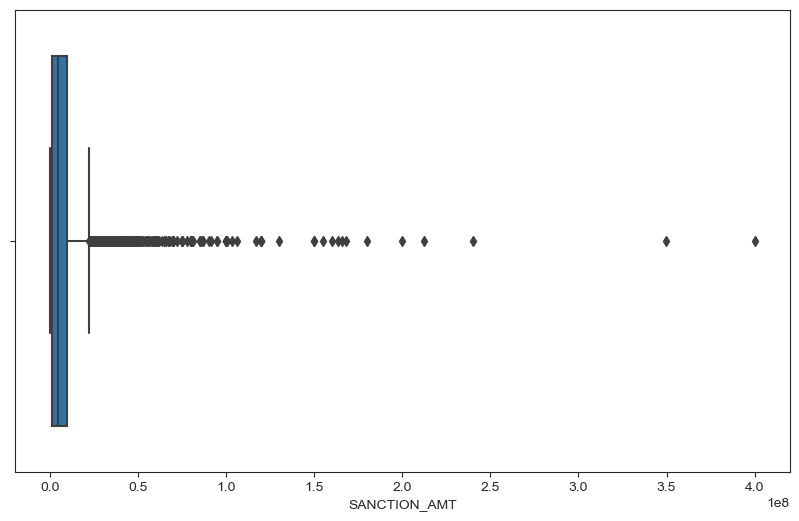

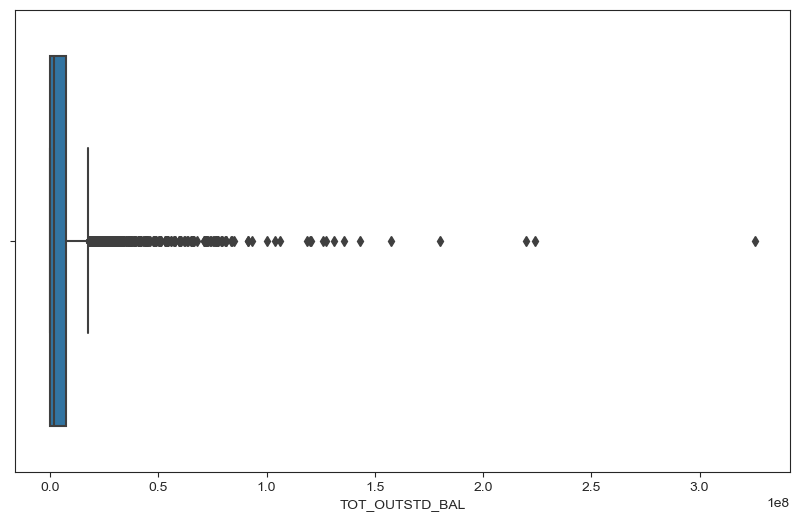

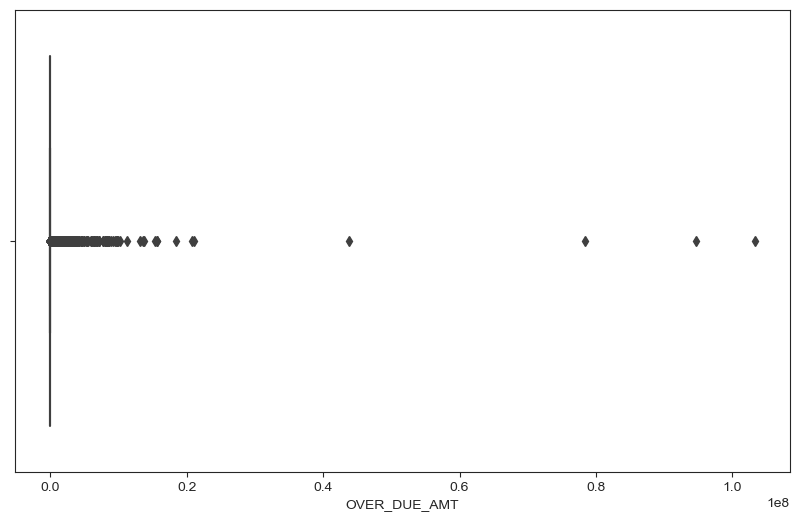

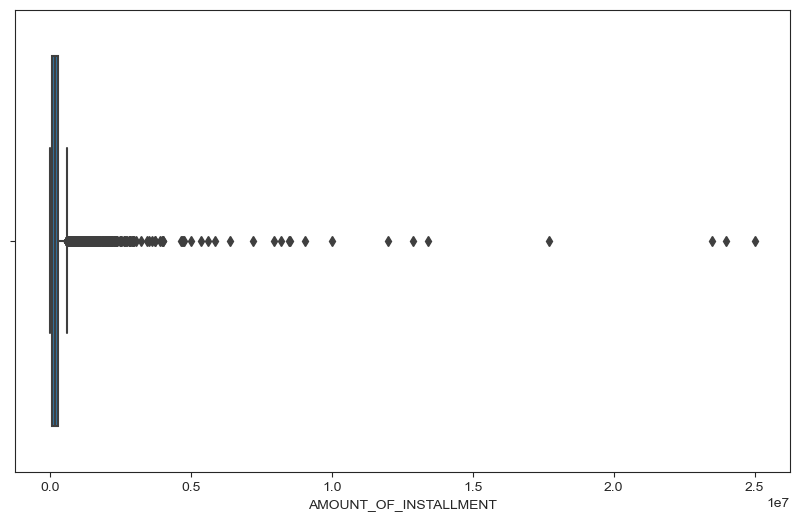

In [25]:
for i in continuous_features:
        plt.figure(figsize=(10,6))
        sns.set_style('ticks')
        ax = sns.boxplot(df[i])

## Detecting Outlier and Capping it

In [26]:
def detect_outliers(col):
    # Finding the IQR
    percentile25 = df[col].quantile(0.25)
    percentile75 = df[col].quantile(0.75)
    print('\n ####', col , '####')
    print("percentile25",percentile25)
    print("percentile75",percentile75)
    iqr = percentile75 - percentile25
    upper_limit = percentile75 + 1.5 * iqr
    lower_limit = percentile25 - 1.5 * iqr
    print("Upper limit",upper_limit)
    print("Lower limit",lower_limit)
    df.loc[(df[col]>upper_limit), col]= upper_limit
    df.loc[(df[col]<lower_limit), col]= lower_limit    
    return df

In [27]:
# for col in continuous_features:
#          detect_outliers(col)

In [28]:
df[continuous_features].skew(axis=0, skipna=True)

NUMBER_OF_INSTALLMENTS     0.134089
SANCTION_AMT               9.111976
TOT_OUTSTD_BAL             8.151152
OVER_DUE_AMT              32.883243
AMOUNT_OF_INSTALLMENT     17.934906
dtype: float64

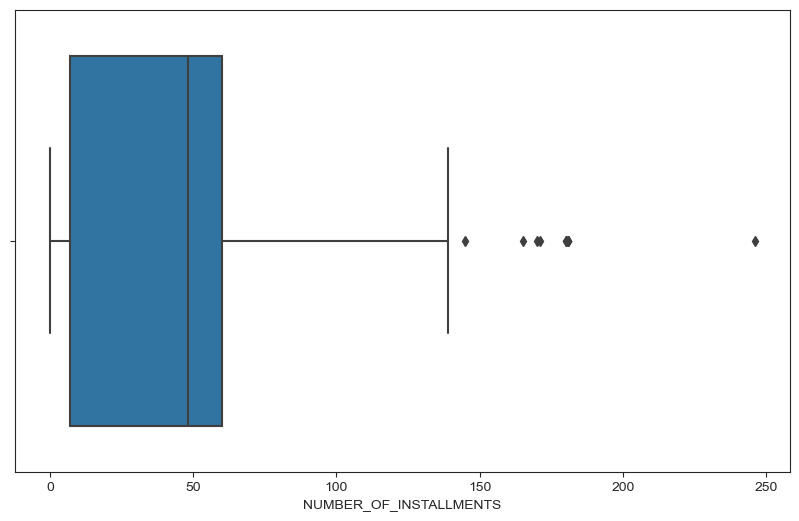

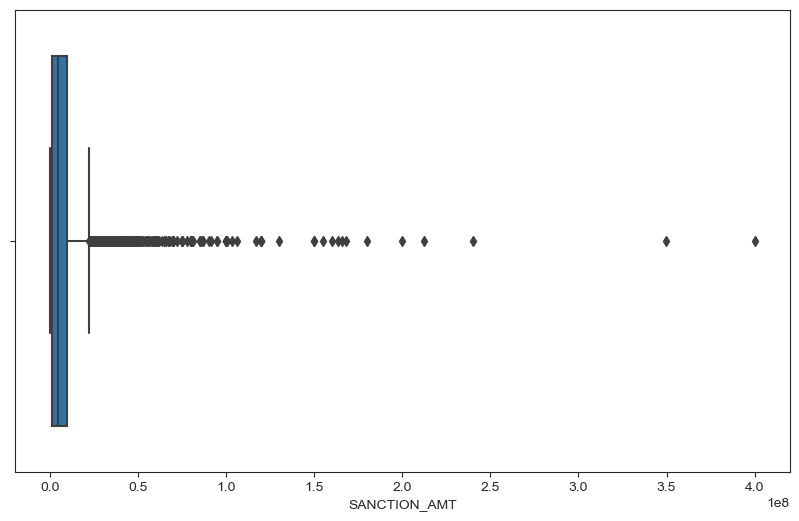

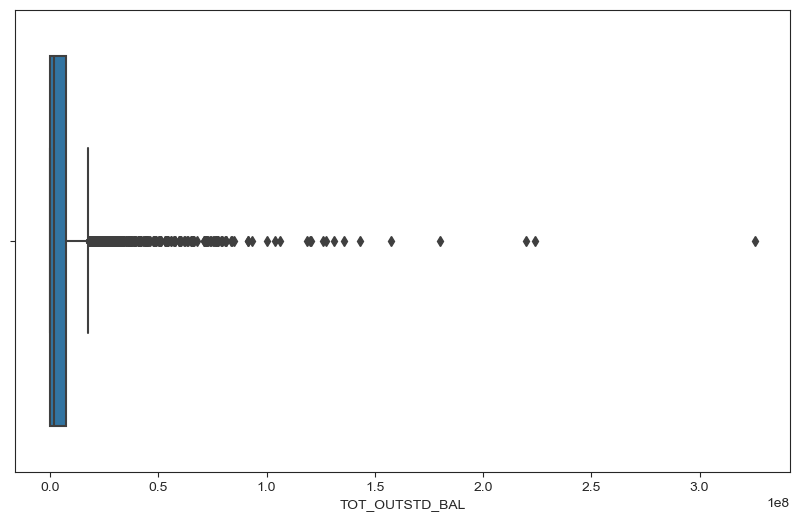

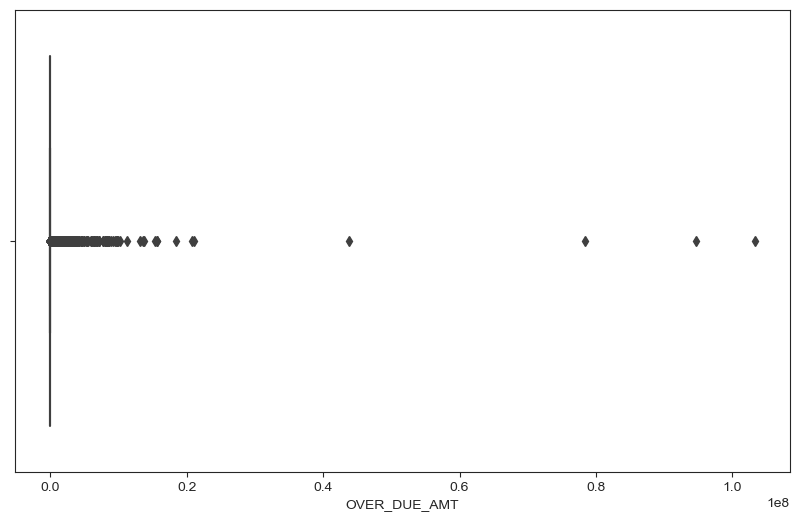

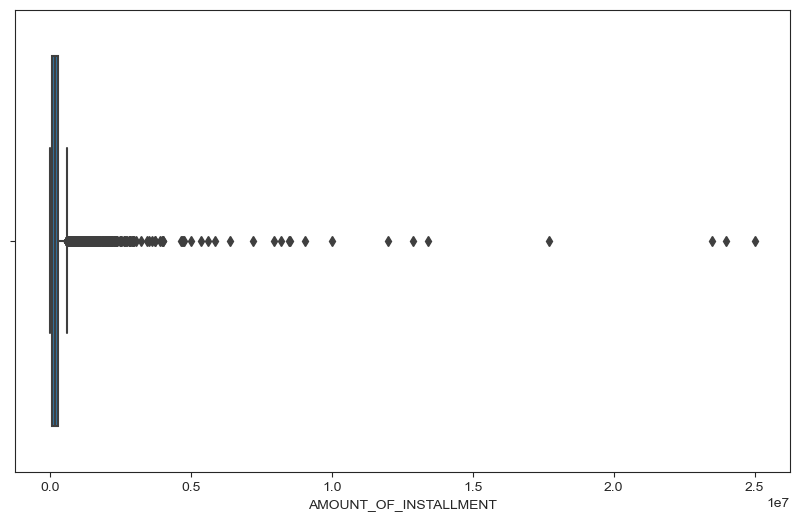

In [29]:
for i in continuous_features:
        plt.figure(figsize=(10,6))
        sns.set_style('ticks')
        ax = sns.boxplot(df[i])

### Create new features based on date columns

#### Converting all the date columns into meaning full information columns ACCOUNT_AGE ,LAST_PAYMENT_AGE, LOAN_DURATION

In [30]:
# convert date columns to datetime data type
df['DATE_REPORTED'] = pd.to_datetime(df['DATE_REPORTED'])
df['DATE_LATEST_PAY_RECEIVED'] = pd.to_datetime(df['DATE_LATEST_PAY_RECEIVED'])
df['DATE_ACC_OPEN'] = pd.to_datetime(df['DATE_ACC_OPEN'])
df['DATE_ACC_CLOSE'] = pd.to_datetime(df['DATE_ACC_CLOSE'])
df['EXPECTED_END_DATE_OF_LOAN'] = pd.to_datetime(df['EXPECTED_END_DATE_OF_LOAN'])



In [31]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6000 entries, 0 to 5999
Data columns (total 15 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   DATE_REPORTED              6000 non-null   datetime64[ns]
 1   currency_code              6000 non-null   object        
 2   REPAYMENT_FREQUENCY        5982 non-null   object        
 3   NUMBER_OF_INSTALLMENTS     5921 non-null   float64       
 4   SANCTION_AMT               6000 non-null   float64       
 5   TOT_OUTSTD_BAL             5981 non-null   float64       
 6   OVER_DUE_AMT               5993 non-null   float64       
 7   AMOUNT_OF_INSTALLMENT      5972 non-null   float64       
 8   DATE_LATEST_PAY_RECEIVED   4647 non-null   datetime64[ns]
 9   DATE_ACC_OPEN              6000 non-null   datetime64[ns]
 10  DATE_ACC_CLOSE             2934 non-null   datetime64[ns]
 11  INSTALMENT_LOAN_TYPE       5920 non-null   object        
 12  loan_s

In [32]:
# extract year, month, day, and day of the week from date columns
df['YEAR_REPORTED'] = df['DATE_REPORTED'].dt.year
df['MONTH_REPORTED'] = df['DATE_REPORTED'].dt.month
df['DAY_REPORTED'] = df['DATE_REPORTED'].dt.day
df['DAY_OF_WEEK_REPORTED'] = df['DATE_REPORTED'].dt.dayofweek



### ACCOUNT_AGE- The date difference of DATE_REPORTED and DATE_ACC_OPEN
### LAST_PAYMENT_AGE- The date difference of DATE_REPORTED and DATE_LATEST_PAY_RECEIVED
### LOAN_DURATION- The date difference of EXPECTED_END_DATE_OF_LOAN and DATE_ACC_OPEN

In [33]:
# create new features based on date columns
df['ACCOUNT_AGE'] = (df['DATE_REPORTED'] - df['DATE_ACC_OPEN']).dt.days
df['LAST_PAYMENT_AGE'] = (df['DATE_REPORTED'] - df['DATE_LATEST_PAY_RECEIVED']).dt.days
df['LOAN_DURATION'] = (df['EXPECTED_END_DATE_OF_LOAN'] - df['DATE_ACC_OPEN']).dt.days


In [34]:
df.head(5)

,DATE_REPORTED,currency_code,REPAYMENT_FREQUENCY,NUMBER_OF_INSTALLMENTS,SANCTION_AMT,TOT_OUTSTD_BAL,OVER_DUE_AMT,AMOUNT_OF_INSTALLMENT,DATE_LATEST_PAY_RECEIVED,DATE_ACC_OPEN,DATE_ACC_CLOSE,INSTALMENT_LOAN_TYPE,loan_status,EXPECTED_END_DATE_OF_LOAN,default_status,YEAR_REPORTED,MONTH_REPORTED,DAY_REPORTED,DAY_OF_WEEK_REPORTED,ACCOUNT_AGE,LAST_PAYMENT_AGE,LOAN_DURATION
0,2018-01-02,TZS,MonthlyInstalments30Days,6.0,400000.0,0.00,205609.4,0.00,2016-11-29,2016-06-29,2016-12-29,OtherInstalmentOperation,Existing,2016-12-29,yes,2018,1,2,1,552,399.0,183
1,2018-01-08,TZS,MonthlyInstalments30Days,61.0,3500000.0,3272849.49,0.0,100243.11,2017-12-29,2017-06-29,2022-07-05,ConsumerLoan,Existing,2022-07-05,NO,2018,1,8,0,193,10.0,1832
2,2018-01-02,TZS,MonthlyInstalments30Days,57.0,4200000.0,870462.93,0.0,106652.40,2017-12-28,2013-12-27,NaT,ConsumerLoan,Existing,2018-09-27,NO,2018,1,2,1,1467,5.0,1735
3,2018-01-02,TZS,MonthlyInstalments30Days,24.0,60000000.0,15740676.93,0.0,2987342.81,2017-12-18,2016-05-11,NaT,BusinessLoan,Existing,2018-05-11,NO,2018,1,2,1,601,15.0,730
4,2018-01-08,TZS,MonthlyInstalments30Days,69.0,3400000.0,828981.51,0.0,99164.00,2017-12-29,2013-02-20,2018-11-16,ConsumerLoan,Existing,2018-11-16,NO,2018,1,8,0,1783,10.0,2095


In [35]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6000 entries, 0 to 5999
Data columns (total 22 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   DATE_REPORTED              6000 non-null   datetime64[ns]
 1   currency_code              6000 non-null   object        
 2   REPAYMENT_FREQUENCY        5982 non-null   object        
 3   NUMBER_OF_INSTALLMENTS     5921 non-null   float64       
 4   SANCTION_AMT               6000 non-null   float64       
 5   TOT_OUTSTD_BAL             5981 non-null   float64       
 6   OVER_DUE_AMT               5993 non-null   float64       
 7   AMOUNT_OF_INSTALLMENT      5972 non-null   float64       
 8   DATE_LATEST_PAY_RECEIVED   4647 non-null   datetime64[ns]
 9   DATE_ACC_OPEN              6000 non-null   datetime64[ns]
 10  DATE_ACC_CLOSE             2934 non-null   datetime64[ns]
 11  INSTALMENT_LOAN_TYPE       5920 non-null   object        
 12  loan_s

In [38]:
##these are the features with nan value
features_with_na=[features for features in df.columns if df[features].isnull().sum()>=1]
for feature in features_with_na:
    print(feature,np.round(df[feature].isnull().mean()*100,5), '% missing values')

REPAYMENT_FREQUENCY 0.3 % missing values
NUMBER_OF_INSTALLMENTS 1.31667 % missing values
TOT_OUTSTD_BAL 0.31667 % missing values
OVER_DUE_AMT 0.11667 % missing values
AMOUNT_OF_INSTALLMENT 0.46667 % missing values
DATE_LATEST_PAY_RECEIVED 22.55 % missing values
DATE_ACC_CLOSE 51.1 % missing values
INSTALMENT_LOAN_TYPE 1.33333 % missing values
LAST_PAYMENT_AGE 22.55 % missing values


In [39]:
df.duplicated().sum()

119

In [90]:
df['LOAN_DURATION'].value_counts()

168     378
31      307
365     255
181     182
184     165
1826    115
1461    112
183     104
182     100
30       99
1838     71
1831     69
1096     69
1836     68
1827     62
2191     60
1832     59
1844     59
1845     58
1834     57
1839     57
1837     54
1841     52
1840     48
243      48
1833     47
1852     46
242      46
1843     44
1849     44
1851     42
1846     41
1847     41
1848     40
730      40
1829     40
1855     39
1828     37
1842     37
1850     35
1856     35
304      34
1854     33
1835     33
273      29
1853     29
1830     29
366      27
1857     26
1095     26
224      23
1812     21
1822     20
1858     19
1825     19
1820     18
2192     18
1817     17
1821     16
1862     16
1110     16
1816     15
1112     15
1106     15
274      15
1824     14
1823     14
1111     14
1814     14
2202     14
245      14
1811     13
1105     13
2193     13
2198     13
1861     13
2222     13
303      13
336      13
1818     12
2221     12
1810     12
370      11
1863

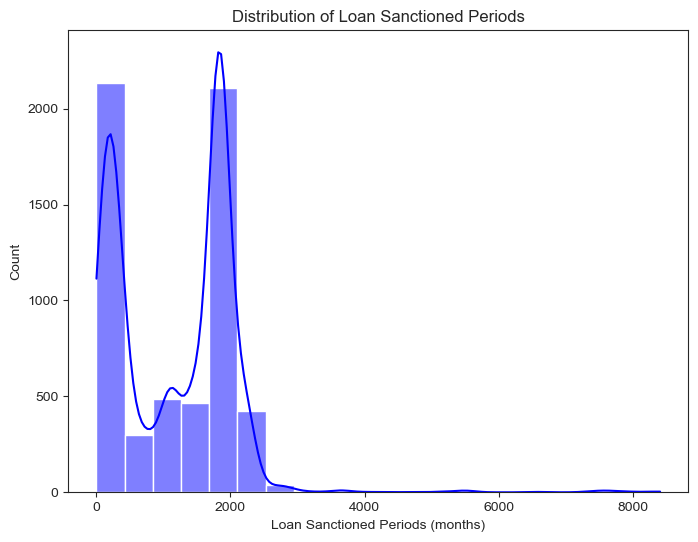

In [91]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot the distribution of loan sanctioned periods
plt.figure(figsize=(8, 6))
sns.histplot(data=df, x='LOAN_DURATION', bins=20, kde=True, color='blue')
plt.title('Distribution of Loan Sanctioned Periods')
plt.xlabel('Loan Sanctioned Periods (months)')
plt.ylabel('Count')
plt.show()


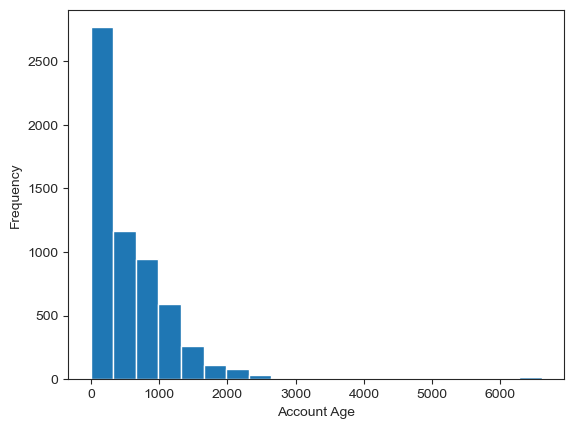

In [92]:


plt.hist(df['ACCOUNT_AGE'], bins=20)
plt.xlabel('Account Age')
plt.ylabel('Frequency')
plt.show()


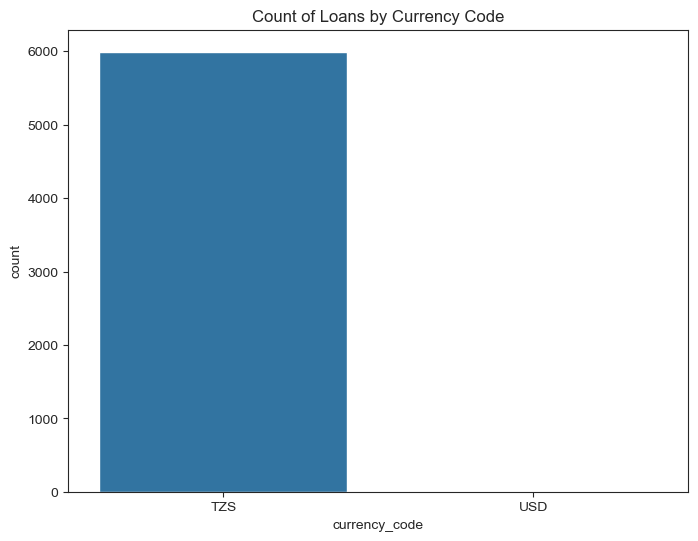

In [93]:
plt.figure(figsize=(8, 6))
sns.countplot(x='currency_code', data=df)
plt.title('Count of Loans by Currency Code')
plt.show()


In [94]:


# Calculate the correlation coefficient
corr_coef = df['AMOUNT_OF_INSTALLMENT'].corr(df['TOT_OUTSTD_BAL'])

# Print the result
print(f"Correlation coefficient: {corr_coef}")


Correlation coefficient: 0.40971004398233546


In [40]:
num_features = [feature for feature in df.columns if df[feature].dtype != 'O']
print('Num of Numerical Features :', len(num_features))

Num of Numerical Features : 17


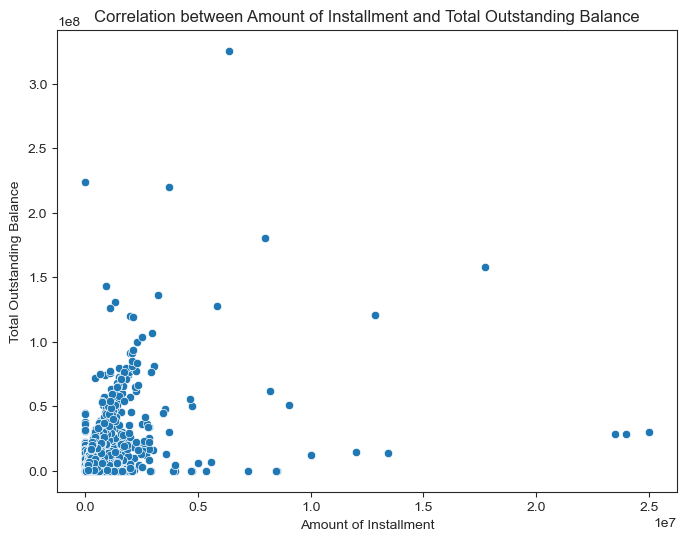

In [95]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8,6))
sns.scatterplot(x='AMOUNT_OF_INSTALLMENT', y='TOT_OUTSTD_BAL', data=df)
plt.title('Correlation between Amount of Installment and Total Outstanding Balance')
plt.xlabel('Amount of Installment')
plt.ylabel('Total Outstanding Balance')
plt.show()


                LOAN_DURATION  TOT_OUTSTD_BAL
LOAN_DURATION        1.000000        0.358923
TOT_OUTSTD_BAL       0.358923        1.000000


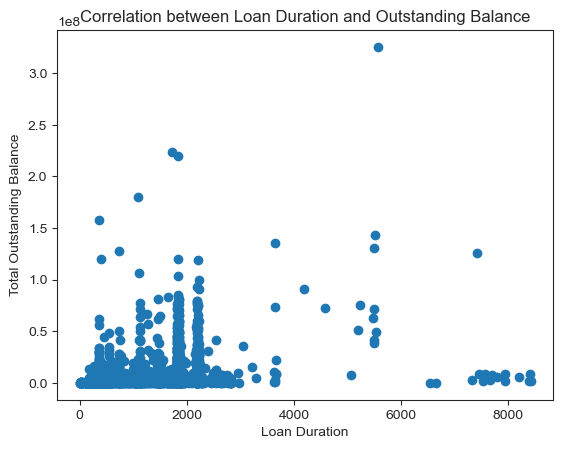

In [96]:
corr_matrix = df[['LOAN_DURATION', 'TOT_OUTSTD_BAL']].corr()
print(corr_matrix)
plt.scatter(df['LOAN_DURATION'], df['TOT_OUTSTD_BAL'])
plt.xlabel('Loan Duration')
plt.ylabel('Total Outstanding Balance')
plt.title('Correlation between Loan Duration and Outstanding Balance')
plt.show()


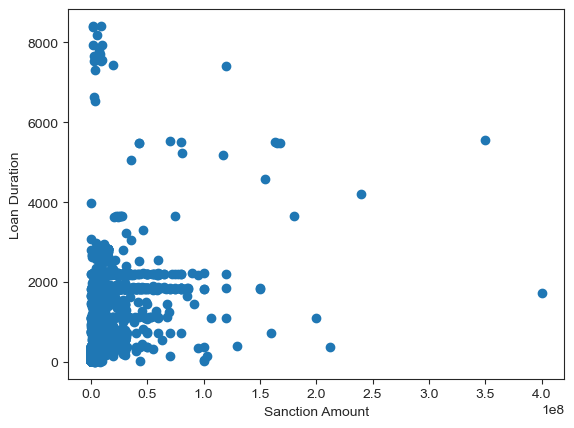

In [97]:
import matplotlib.pyplot as plt

plt.scatter(df['SANCTION_AMT'], df['LOAN_DURATION'])
plt.xlabel('Sanction Amount')
plt.ylabel('Loan Duration')
plt.show()


In [41]:
num_features

['DATE_REPORTED',
 'NUMBER_OF_INSTALLMENTS',
 'SANCTION_AMT',
 'TOT_OUTSTD_BAL',
 'OVER_DUE_AMT',
 'AMOUNT_OF_INSTALLMENT',
 'DATE_LATEST_PAY_RECEIVED',
 'DATE_ACC_OPEN',
 'DATE_ACC_CLOSE',
 'EXPECTED_END_DATE_OF_LOAN',
 'YEAR_REPORTED',
 'MONTH_REPORTED',
 'DAY_REPORTED',
 'DAY_OF_WEEK_REPORTED',
 'ACCOUNT_AGE',
 'LAST_PAYMENT_AGE',
 'LOAN_DURATION']

In [42]:
cat_features = [feature for feature in df.columns if df[feature].dtype == 'O']
print('Num of Categorical Features :', len(cat_features))

Num of Categorical Features : 5


In [43]:
discrete_features=[feature for feature in num_features if len(df[feature].unique())<=25]
print('Num of Discrete Features :',len(discrete_features))

Num of Discrete Features : 4


In [44]:
continuous_features=[feature for feature in num_features if feature not in discrete_features]
print('Num of Continuous Features :',len(continuous_features))

Num of Continuous Features : 13


### Final Preprocessed Data for Encoding

In [45]:
X = df.drop(['default_status','DATE_REPORTED', 'DATE_LATEST_PAY_RECEIVED', 'DATE_ACC_OPEN', 'DATE_ACC_CLOSE', 'EXPECTED_END_DATE_OF_LOAN'], axis=1)
y = df['default_status']

In [88]:
X.head(5)

,currency_code,REPAYMENT_FREQUENCY,NUMBER_OF_INSTALLMENTS,SANCTION_AMT,TOT_OUTSTD_BAL,OVER_DUE_AMT,AMOUNT_OF_INSTALLMENT,INSTALMENT_LOAN_TYPE,loan_status,YEAR_REPORTED,MONTH_REPORTED,DAY_REPORTED,DAY_OF_WEEK_REPORTED,ACCOUNT_AGE,LAST_PAYMENT_AGE,LOAN_DURATION
0,TZS,MonthlyInstalments30Days,6.0,400000.0,0.00,205609.4,0.00,OtherInstalmentOperation,Existing,2018,1,2,1,552,399.0,183
1,TZS,MonthlyInstalments30Days,61.0,3500000.0,3272849.49,0.0,100243.11,ConsumerLoan,Existing,2018,1,8,0,193,10.0,1832
2,TZS,MonthlyInstalments30Days,57.0,4200000.0,870462.93,0.0,106652.40,ConsumerLoan,Existing,2018,1,2,1,1467,5.0,1735
3,TZS,MonthlyInstalments30Days,24.0,60000000.0,15740676.93,0.0,2987342.81,BusinessLoan,Existing,2018,1,2,1,601,15.0,730
4,TZS,MonthlyInstalments30Days,69.0,3400000.0,828981.51,0.0,99164.00,ConsumerLoan,Existing,2018,1,8,0,1783,10.0,2095


In [47]:
# If the target column has Denied it is encoded as 1 others as 0
y= np.where(y=='yes',1,0)


In [89]:
y[0]

1

In [49]:
num_features_X = [feature for feature in X.columns if X[feature].dtype != 'O']
print('Num of Numerical Features :', len(num_features))

Num of Numerical Features : 17


In [50]:
num_features_X

['NUMBER_OF_INSTALLMENTS',
 'SANCTION_AMT',
 'TOT_OUTSTD_BAL',
 'OVER_DUE_AMT',
 'AMOUNT_OF_INSTALLMENT',
 'YEAR_REPORTED',
 'MONTH_REPORTED',
 'DAY_REPORTED',
 'DAY_OF_WEEK_REPORTED',
 'ACCOUNT_AGE',
 'LAST_PAYMENT_AGE',
 'LOAN_DURATION']

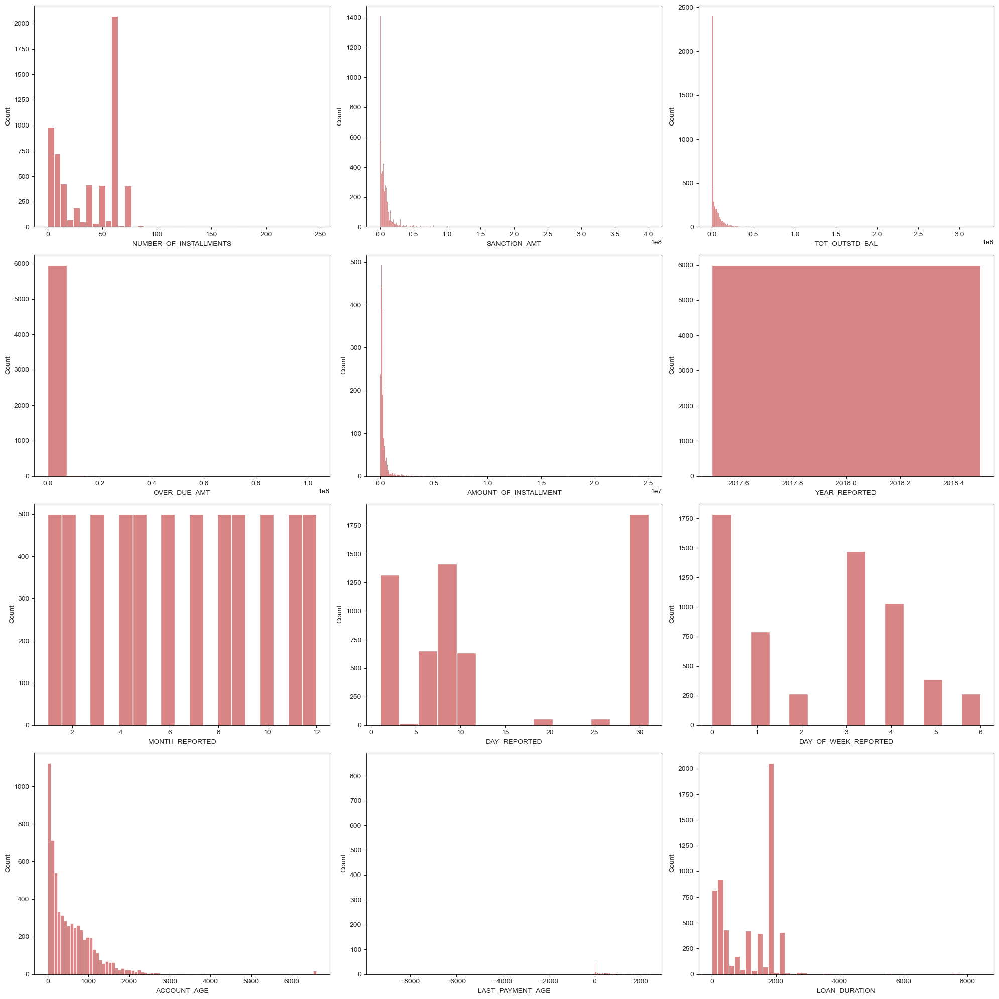

In [51]:
# distribution of data before scaling
plt.figure(figsize=(20, 20))
for i, col in enumerate(['NUMBER_OF_INSTALLMENTS', 'SANCTION_AMT', 'TOT_OUTSTD_BAL', 'OVER_DUE_AMT', 'AMOUNT_OF_INSTALLMENT', 'YEAR_REPORTED', 'MONTH_REPORTED', 'DAY_REPORTED', 'DAY_OF_WEEK_REPORTED', 'ACCOUNT_AGE', 'LAST_PAYMENT_AGE', 'LOAN_DURATION']):
    plt.subplot(4, 3, i+1)
    sns.histplot(x=X[col], color='indianred')
    plt.xlabel(col)
    plt.tight_layout()


In [52]:
# Check Skewness
X[num_features_X].skew(axis=0, skipna=True)

NUMBER_OF_INSTALLMENTS     0.134089
SANCTION_AMT               9.111976
TOT_OUTSTD_BAL             8.151152
OVER_DUE_AMT              32.883243
AMOUNT_OF_INSTALLMENT     17.934906
YEAR_REPORTED              0.000000
MONTH_REPORTED             0.000000
DAY_REPORTED               0.596838
DAY_OF_WEEK_REPORTED       0.188155
ACCOUNT_AGE                3.510862
LAST_PAYMENT_AGE         -13.973260
LOAN_DURATION              1.317177
dtype: float64

In [53]:
cat_features_x = [feature for feature in X.columns if X[feature].dtype == 'O']
print('Num of Categorical Features :', len(cat_features_x))

for feature in cat_features_x:
    print(feature,':', X[feature].nunique())

Num of Categorical Features : 4
currency_code : 2
REPAYMENT_FREQUENCY : 6
INSTALMENT_LOAN_TYPE : 8
loan_status : 4


In [54]:
X.shape

(6000, 16)

#### Feature Encoding and Scaling
    One Hot Encoding for Columns which had lesser unique values and not ordinal

        One hot encoding is a process by which categorical variables are converted into a form that could be provided to ML algorithms to do a better job in prediction.
    
    Ordinal Encoding for Columns which has many unique categories

        Ordinal encoding is used here as label encoder is supported for column transformer.
        Ordinal encoding is used for Ordinal Variable. Variable comprises a finite set of discrete values with a ranked ordering between values.
        
    Standard Scaler

        Standardize features by removing the mean and scaling to unit variance.
    Power Transformer

        Power transforms are a technique for transforming numerical input or output variables to have a Gaussian or more-Gaussian-like probability distribution.

#### Selecting number features for preprocessing

In [55]:
num_features = list(X.select_dtypes(exclude="object").columns)

### Preprocessing using Column Transformer

In [56]:
# Create Column Transformer with 3 types of transformers
or_columns = ['loan_status','INSTALMENT_LOAN_TYPE','REPAYMENT_FREQUENCY']
oh_columns = ['currency_code']
transform_columns= ['OVER_DUE_AMT','SANCTION_AMT','AMOUNT_OF_INSTALLMENT','OVER_DUE_AMT','LAST_PAYMENT_AGE','LOAN_DURATION']

from sklearn.preprocessing import OneHotEncoder, StandardScaler,OrdinalEncoder, PowerTransformer
from sklearn.compose import ColumnTransformer 
from sklearn.pipeline import Pipeline

numeric_transformer = StandardScaler()
oh_transformer = OneHotEncoder()
ordinal_encoder = OrdinalEncoder()

transform_pipe = Pipeline(steps=[
    ('transformer', PowerTransformer(method='yeo-johnson'))
])

preprocessor = ColumnTransformer(
    [
        ("OneHotEncoder", oh_transformer, oh_columns),
        ("Ordinal_Encoder", ordinal_encoder, or_columns),
        ("Transformer", transform_pipe, transform_columns),
        ("StandardScaler", numeric_transformer, num_features)
    ]
)

In [57]:
X.head(4)

,currency_code,REPAYMENT_FREQUENCY,NUMBER_OF_INSTALLMENTS,SANCTION_AMT,TOT_OUTSTD_BAL,OVER_DUE_AMT,AMOUNT_OF_INSTALLMENT,INSTALMENT_LOAN_TYPE,loan_status,YEAR_REPORTED,MONTH_REPORTED,DAY_REPORTED,DAY_OF_WEEK_REPORTED,ACCOUNT_AGE,LAST_PAYMENT_AGE,LOAN_DURATION
0,TZS,MonthlyInstalments30Days,6.0,400000.0,0.00,205609.4,0.00,OtherInstalmentOperation,Existing,2018,1,2,1,552,399.0,183
1,TZS,MonthlyInstalments30Days,61.0,3500000.0,3272849.49,0.0,100243.11,ConsumerLoan,Existing,2018,1,8,0,193,10.0,1832
2,TZS,MonthlyInstalments30Days,57.0,4200000.0,870462.93,0.0,106652.40,ConsumerLoan,Existing,2018,1,2,1,1467,5.0,1735
3,TZS,MonthlyInstalments30Days,24.0,60000000.0,15740676.93,0.0,2987342.81,BusinessLoan,Existing,2018,1,2,1,601,15.0,730


In [58]:
X.isnull().sum()

currency_code                0
REPAYMENT_FREQUENCY         18
NUMBER_OF_INSTALLMENTS      79
SANCTION_AMT                 0
TOT_OUTSTD_BAL              19
OVER_DUE_AMT                 7
AMOUNT_OF_INSTALLMENT       28
INSTALMENT_LOAN_TYPE        80
loan_status                  0
YEAR_REPORTED                0
MONTH_REPORTED               0
DAY_REPORTED                 0
DAY_OF_WEEK_REPORTED         0
ACCOUNT_AGE                  0
LAST_PAYMENT_AGE          1353
LOAN_DURATION                0
dtype: int64

In [59]:
# fill missing values with mode
X['REPAYMENT_FREQUENCY'] = X['REPAYMENT_FREQUENCY'].fillna(df['REPAYMENT_FREQUENCY'].mode()[0])


In [60]:
# replace missing values with median
X['NUMBER_OF_INSTALLMENTS'].fillna(X['NUMBER_OF_INSTALLMENTS'].median(), inplace=True)

In [61]:
# replace missing values with median
X['TOT_OUTSTD_BAL'].fillna(X['TOT_OUTSTD_BAL'].median(), inplace=True)

In [63]:
# replace missing values with median
X['OVER_DUE_AMT'].fillna(X['OVER_DUE_AMT'].median(), inplace=True)

In [64]:
# replace missing values with median
X['AMOUNT_OF_INSTALLMENT'].fillna(X['AMOUNT_OF_INSTALLMENT'].median(), inplace=True)

In [65]:

# fill missing values with mode
X['INSTALMENT_LOAN_TYPE'] = X['INSTALMENT_LOAN_TYPE'].fillna(df['INSTALMENT_LOAN_TYPE'].mode()[0])

In [66]:
# replace missing values with median
X['LAST_PAYMENT_AGE'].fillna(X['LAST_PAYMENT_AGE'].median(), inplace=True)

In [67]:
X.head(4)

,currency_code,REPAYMENT_FREQUENCY,NUMBER_OF_INSTALLMENTS,SANCTION_AMT,TOT_OUTSTD_BAL,OVER_DUE_AMT,AMOUNT_OF_INSTALLMENT,INSTALMENT_LOAN_TYPE,loan_status,YEAR_REPORTED,MONTH_REPORTED,DAY_REPORTED,DAY_OF_WEEK_REPORTED,ACCOUNT_AGE,LAST_PAYMENT_AGE,LOAN_DURATION
0,TZS,MonthlyInstalments30Days,6.0,400000.0,0.00,205609.4,0.00,OtherInstalmentOperation,Existing,2018,1,2,1,552,399.0,183
1,TZS,MonthlyInstalments30Days,61.0,3500000.0,3272849.49,0.0,100243.11,ConsumerLoan,Existing,2018,1,8,0,193,10.0,1832
2,TZS,MonthlyInstalments30Days,57.0,4200000.0,870462.93,0.0,106652.40,ConsumerLoan,Existing,2018,1,2,1,1467,5.0,1735
3,TZS,MonthlyInstalments30Days,24.0,60000000.0,15740676.93,0.0,2987342.81,BusinessLoan,Existing,2018,1,2,1,601,15.0,730


In [ ]:
TZS	MonthlyInstalments30Days	57.0	4200000.0	870462.93	0.0	106652.40	ConsumerLoan	Existing	2018	1	2	1	1467	5.0	1735

In [68]:
X_preprocessed = preprocessor.fit_transform(X)

In [69]:
X_preprocessed.shape

(6000, 23)

In [103]:
import pickle

# Create Column Transformer with 3 types of transformers
# Define your preprocessor here

# Fit and transform the preprocessor on your data
X_preprocessed = preprocessor.fit_transform(X)

# Save the preprocessor using pickle
with open('preprocessor.pkl', 'wb') as f:
    pickle.dump(preprocessor, f)

# Load the preprocessor using pickle
with open('preprocessor.pkl', 'rb') as f:
    preprocessor = pickle.load(f)



In [114]:
  input_data = pd.DataFrame({
    'currency_code': 'TZS',
    'REPAYMENT_FREQUENCY': 'MonthlyInstalments30Days',
    'NUMBER_OF_INSTALLMENTS': 6.0,
    'SANCTION_AMT': 400000,
    'TOT_OUTSTD_BAL': 0.00,
    'OVER_DUE_AMT': 205609.4,
    'AMOUNT_OF_INSTALLMENT': 0.00,
    'INSTALMENT_LOAN_TYPE': 'OtherInstalmentOperation',
    'loan_status': 'Existing',
    'YEAR_REPORTED': 2018,
    'MONTH_REPORTED': 1,
    'DAY_REPORTED': 2,
    'DAY_OF_WEEK_REPORTED': 1,
    'ACCOUNT_AGE': 552,
    'LAST_PAYMENT_AGE': 399.0,
    'LOAN_DURATION': 183
}, index=[0])


In [120]:
'1'=='1'

True

In [116]:
# Use the loaded preprocessor to transform new data
X_new_preprocessed = preprocessor.transform(input_data)
X_new_preprocessed

array([[ 1.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         6.00000000e+00,  4.00000000e+00,  2.58623613e+00,
        -1.23099993e+00, -2.45014839e+00,  2.58623613e+00,
         1.25341034e+00, -1.20007273e+00, -1.15729124e+00,
        -4.98438122e-01, -4.62791715e-01,  2.73292354e-03,
        -3.64142793e-01,  0.00000000e+00, -1.59325501e+00,
        -1.03142875e+00, -6.59960326e-01, -1.81482431e-02,
         7.98842629e-01, -1.10554782e+00]])

## Classification

In [70]:
from imblearn.combine import SMOTETomek, SMOTEENN

# Resampling the minority class. The strategy can be changed as required.
smt = SMOTEENN(random_state=42,sampling_strategy='minority' )
# Fit the model to generate the data.
X_res, y_res = smt.fit_resample(X_preprocessed, y)

#### Train Test Split
    The train-test split procedure is used to estimate the performance of machine learning algorithms when they are used to make predictions on data not used to train the model.

    It is a fast and easy procedure to perform, the results of which allow you to compare the performance of machine learning algorithms.

In [71]:
from sklearn.model_selection import  train_test_split
# separate dataset into train and test
X_train, X_test, y_train, y_test = train_test_split(X_res,y_res,test_size=0.2,random_state=42)
X_train.shape, X_test.shape

((8955, 23), (2239, 23))

In [85]:
X_test[0]

array([ 1.        ,  0.        ,  0.        ,  1.        ,  4.        ,
        2.58768251,  0.64579057,  0.37155205,  2.58768251, -0.17067124,
       -0.2741505 , -0.52001934,  0.08933273,  0.0631178 ,  2.76344428,
       -0.03344918,  0.        , -1.01388955, -0.51516226,  0.41039025,
        0.5579431 , -0.06926693, -0.50881919])

In [72]:
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report,ConfusionMatrixDisplay, \
                            precision_score, recall_score, f1_score, roc_auc_score,roc_curve 
from xgboost import XGBClassifier
from catboost import CatBoostClassifier

In [73]:
def evaluate_clf(true, predicted):
    acc = accuracy_score(true, predicted) # Calculate Accuracy
    f1 = f1_score(true, predicted) # Calculate F1-score
    precision = precision_score(true, predicted) # Calculate Precision
    recall = recall_score(true, predicted)  # Calculate Recall
    roc_auc = roc_auc_score(true, predicted) #Calculate Roc
    return acc, f1 , precision, recall, roc_auc

In [74]:
models = {
    "Random Forest": RandomForestClassifier(),
    "Decision Tree": DecisionTreeClassifier(),
    "Gradient Boosting": GradientBoostingClassifier(),
    "Logistic Regression": LogisticRegression(),
     "K-Neighbors Classifier": KNeighborsClassifier(),
    "XGBClassifier": XGBClassifier(), 
     "CatBoosting Classifier": CatBoostClassifier(verbose=False),
     "Support Vector Classifier": SVC(),
    "AdaBoost Classifier": AdaBoostClassifier()
}

In [75]:
# Create a function which can evaluate models and return a report 
def evaluate_models(X, y, models):
    '''
    This function takes in X and y and models dictionary as input
    It splits the data into Train Test split
    Iterates through the given model dictionary and evaluates the metrics
    Returns: Dataframe which contains report of all models metrics with cost
    '''
    # separate dataset into train and test
    X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=42)
    
    models_list = []
    accuracy_list = []
    auc= []
    
    for i in range(len(list(models))):
        model = list(models.values())[i]
        model.fit(X_train, y_train) # Train model

        # Make predictions
        y_train_pred = model.predict(X_train)
        y_test_pred = model.predict(X_test)

        # Training set performance
        model_train_accuracy, model_train_f1,model_train_precision,\
        model_train_recall,model_train_rocauc_score=evaluate_clf(y_train ,y_train_pred)


        # Test set performance
        model_test_accuracy,model_test_f1,model_test_precision,\
        model_test_recall,model_test_rocauc_score=evaluate_clf(y_test, y_test_pred)

        print(list(models.keys())[i])
        models_list.append(list(models.keys())[i])

        print('Model performance for Training set')
        print("- Accuracy: {:.4f}".format(model_train_accuracy))
        print('- F1 score: {:.4f}'.format(model_train_f1)) 
        print('- Precision: {:.4f}'.format(model_train_precision))
        print('- Recall: {:.4f}'.format(model_train_recall))
        print('- Roc Auc Score: {:.4f}'.format(model_train_rocauc_score))

        print('----------------------------------')

        print('Model performance for Test set')
        print('- Accuracy: {:.4f}'.format(model_test_accuracy))
        accuracy_list.append(model_test_accuracy)
        print('- F1 score: {:.4f}'.format(model_test_f1))
        print('- Precision: {:.4f}'.format(model_test_precision))
        print('- Recall: {:.4f}'.format(model_test_recall))
        print('- Roc Auc Score: {:.4f}'.format(model_test_rocauc_score))
        auc.append(model_test_rocauc_score)
        print('='*35)
        print('\n')
        
    report=pd.DataFrame(list(zip(models_list, accuracy_list)), columns=['Model Name', 'Accuracy']).sort_values(by=['Accuracy'], ascending=False)
        
    return report

## Model Training

In [76]:
base_model_report =evaluate_models(X=X_res, y=y_res, models=models)

Random Forest
Model performance for Training set
- Accuracy: 1.0000
- F1 score: 1.0000
- Precision: 1.0000
- Recall: 1.0000
- Roc Auc Score: 1.0000
----------------------------------
Model performance for Test set
- Accuracy: 0.9964
- F1 score: 0.9965
- Precision: 0.9929
- Recall: 1.0000
- Roc Auc Score: 0.9964


Decision Tree
Model performance for Training set
- Accuracy: 1.0000
- F1 score: 1.0000
- Precision: 1.0000
- Recall: 1.0000
- Roc Auc Score: 1.0000
----------------------------------
Model performance for Test set
- Accuracy: 0.9960
- F1 score: 0.9960
- Precision: 0.9921
- Recall: 1.0000
- Roc Auc Score: 0.9960


Gradient Boosting
Model performance for Training set
- Accuracy: 0.9982
- F1 score: 0.9982
- Precision: 0.9969
- Recall: 0.9996
- Roc Auc Score: 0.9982
----------------------------------
Model performance for Test set
- Accuracy: 0.9924
- F1 score: 0.9925
- Precision: 0.9860
- Recall: 0.9991
- Roc Auc Score: 0.9924


Logistic Regression
Model performance for Training 

## Results of All Models

In [77]:
base_model_report

,Model Name,Accuracy
4,K-Neighbors Classifier,0.997767
5,XGBClassifier,0.996874
0,Random Forest,0.996427
1,Decision Tree,0.995980
6,CatBoosting Classifier,0.995980
8,AdaBoost Classifier,0.995534
2,Gradient Boosting,0.992407
7,Support Vector Classifier,0.988388
3,Logistic Regression,0.979455


### Here we can use Random Forest for Hyper Parameter Tuning

### Define the parameter distribution for Random forest

In [78]:
#Initialize few parameter for Hyperparamter tuning
xgboost_params = {
    'max_depth':range(3,10,2),
    'min_child_weight':range(1,6,2)
}

rf_params = {
    "max_depth": [10, 12, None, 15, 20],
    "max_features": ['sqrt', 'log2', None],
    "n_estimators": [10, 50, 100, 200]
}

knn_params = {
    "algorithm": ['auto', 'ball_tree', 'kd_tree','brute'],
    "weights": ['uniform', 'distance'],
    "n_neighbors": [3, 4, 5, 7, 9],
}

In [79]:
# Models list for Hyperparameter tuning
randomcv_models = [
    ('XGBoost', XGBClassifier(), xgboost_params),
    ("RF", RandomForestClassifier(), rf_params),
    ("KNN", KNeighborsClassifier(), knn_params)
]

### Create a function for model training and report which can be used in hyperparameter tuning loop

In [80]:
from sklearn.model_selection import RandomizedSearchCV

model_param = {}
for name, model, params in randomcv_models:
    random = RandomizedSearchCV(estimator=model,
                                   param_distributions=params,
                                   n_iter=100,
                                   cv=3,
                                   verbose=2,
                                   n_jobs=-1)
    random.fit(X_res, y_res)
    model_param[name] = random.best_params_

for model_name in model_param:
    print(f"---------------- Best Params for {model_name} -------------------")
    print(model_param[model_name])

Fitting 3 folds for each of 12 candidates, totalling 36 fits
Fitting 3 folds for each of 60 candidates, totalling 180 fits
Fitting 3 folds for each of 40 candidates, totalling 120 fits
---------------- Best Params for XGBoost -------------------
{'min_child_weight': 1, 'max_depth': 9}
---------------- Best Params for RF -------------------
{'n_estimators': 10, 'max_features': 'sqrt', 'max_depth': 15}
---------------- Best Params for KNN -------------------
{'weights': 'distance', 'n_neighbors': 3, 'algorithm': 'auto'}


## Retraining the Model with best Parameters

In [81]:
from sklearn.metrics import roc_auc_score,roc_curve
best_models = {
    "Random Forest Classifier": RandomForestClassifier(**model_param['RF']),
    "KNeighborsClassifier": KNeighborsClassifier(**model_param['KNN']),
    "XGBClassifier": XGBClassifier(**model_param['XGBoost'],n_jobs=-1),
}
tuned_report =evaluate_models(X=X_res, y=y_res, models=best_models)

Random Forest Classifier
Model performance for Training set
- Accuracy: 0.9998
- F1 score: 0.9998
- Precision: 0.9996
- Recall: 1.0000
- Roc Auc Score: 0.9998
----------------------------------
Model performance for Test set
- Accuracy: 0.9969
- F1 score: 0.9969
- Precision: 0.9938
- Recall: 1.0000
- Roc Auc Score: 0.9969


KNeighborsClassifier
Model performance for Training set
- Accuracy: 1.0000
- F1 score: 1.0000
- Precision: 1.0000
- Recall: 1.0000
- Roc Auc Score: 1.0000
----------------------------------
Model performance for Test set
- Accuracy: 0.9982
- F1 score: 0.9982
- Precision: 0.9965
- Recall: 1.0000
- Roc Auc Score: 0.9982


XGBClassifier
Model performance for Training set
- Accuracy: 1.0000
- F1 score: 1.0000
- Precision: 1.0000
- Recall: 1.0000
- Roc Auc Score: 1.0000
----------------------------------
Model performance for Test set
- Accuracy: 0.9978
- F1 score: 0.9978
- Precision: 0.9956
- Recall: 1.0000
- Roc Auc Score: 0.9978




In [82]:
tuned_report

,Model Name,Accuracy
1,KNeighborsClassifier,0.998213
2,XGBClassifier,0.997767
0,Random Forest Classifier,0.996874


In [83]:
best_model = RandomForestClassifier(**model_param['RF'])
best_model = best_model.fit(X_train,y_train)
y_pred = best_model.predict(X_test)
score = accuracy_score(y_test,y_pred)
cr = classification_report(y_test,y_pred)

print("FINAL MODEL 'RandomForestClassifier'")
print ("Accuracy Score value: {:.4f}".format(score))
print (cr)

FINAL MODEL 'RandomForestClassifier'
Accuracy Score value: 0.9969
              precision    recall  f1-score   support

           0       1.00      0.99      1.00      1113
           1       0.99      1.00      1.00      1126

    accuracy                           1.00      2239
   macro avg       1.00      1.00      1.00      2239
weighted avg       1.00      1.00      1.00      2239



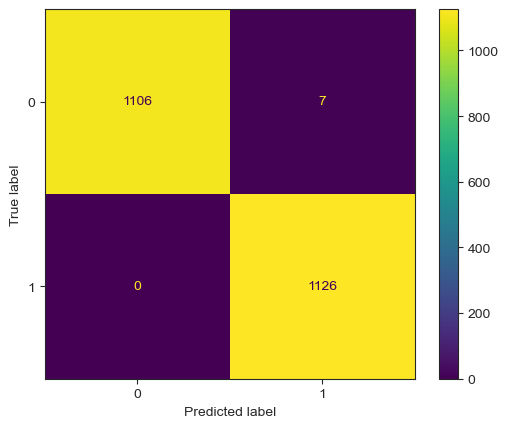

In [84]:
from sklearn.metrics import ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_estimator(best_model, X_test, y_test)

In [87]:
best_model.predict([[ 1.        ,  0.        ,  0.        ,  1.        ,  4.        ,
        2.58768251,  0.64579057,  0.37155205,  2.58768251, -0.17067124,
       -0.2741505 , -0.52001934,  0.08933273,  0.0631178 ,  2.76344428,
       -0.03344918,  0.        , -1.01388955, -0.51516226,  0.41039025,
        0.5579431 , -0.06926693, -0.50881919]])

array([1])

In [104]:
import pickle

# saving the best model
with open('best_model_RF.pkl', 'wb') as f:
    pickle.dump(best_model, f)


In [117]:
with open('best_model_RF.pkl', 'rb') as f:
    loaded_model = pickle.load(f)

In [118]:
loaded_model.predict(X_new_preprocessed)

array([1])

# Best Model is Random Forest with Accuracy 99.64%